<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"></ul></div>


#  Introduction to Remotely Sensed Fire Datasets and the IPCC Greenhouse Gas Inventory Process

## Introduction

> The purpose of this exercise is to provide you with some 
> practical experience of the sort of products that are obtained on
> vegetation fires and biomass burning from Earth orbiting satellites,
> and an overview of how these fit into the IPCC Greenhouse Gas (GHG)
> Inventory Process. 
>
> **Learning objectives** are to gain an understanding of the process by
> which countries calculate and report their GHG emissions to the IPCC,
> and of some of the remotely sensed fire datasets that can be of use in
> these and other calculations.
>

This practical originally prepared by [Prof. Martin Wooster, KCL](https://www.kcl.ac.uk/sspp/departments/geography/people/academic/wooster/index.aspx) and updated by [Prof. Philip Lewis, UCL](http://www2.geog.ucl.ac.uk/~plewis).

## Learning outcomes

-   Understand the basis of the IPPCC process for estimating GHG
    emission from vegetation fires, and be able to use the basic
    spreadsheets involved in this calculation.

-   Understand the basics of Active Fire and Burned Area datasets and
    how they are derived from remote sensing observations, appreciating
    their main advantages and disadvantages

-   Visualise active fire datasets and burned area datasets, and apply some
    simple processing to these (modifying supplied Python scripts)


In [1]:
from codes import *

# unzip data files
import zipfile
zipfile.ZipFile("files/200909021445.zip").extractall("docs/files")


%matplotlib notebook
_='''
Run this cell first to load required libraries
'''

>
> **[2006 IPCC Guidelines for National Greenhouse Gas Inventories, Vol 4.](files/V4_04_Ch4_Forest_Land.pdf)** For updated guidelines, but the basic materials may be found in:

> **[IPCC\_GHG\_LULUCF\_merged.pdf](files/IPCC\_GHG\_LULUCF\_merged.pdf) --** the ***IPCC Good Practice
> Guidance Manual*** for estimating GHG Emissions from Land Use,
> Land-Use Change and Forestry. GHG emissions from open vegetation fires
> fall within this category.
>
> **[Anx\_3A\_1\_Data\_Tables.pdf](files/Anx\_3A\_1\_Data\_Tables.pdf)** -- Annex from the ***IPCC Good
> Practice Guidance Manual*** for estimating GHG Emissions from Land
> Use, Land-Use Change and Forestry. Page 3.179 -- 3.181 provides
> information necessary for calculating GHG emissions from open
> vegetation fires.

See also:

* [2019 refinement](https://www.ipcc-nggip.iges.or.jp/home/2019refinement.html)


You also have access to the following data files:


    -rw-r--r--  1 user  group        258 16 Jan 11:46 files/200909021445.hdr
    -rw-r--r--  1 user  group  165347328 16 Jan 11:46 files/200909021445.img
    -rw-r--r--  1 user  group    2211721 16 Jan 11:46 files/MCD45A1.A2008214.h19v10.005.2008279131907.hdf
    -rw-r--r--  1 user  group     168448 16 Jan 11:46 files/ModisBurnedArea_by_country_landuse_vegetation.xls
    -rw-r--r--  1 user  group      33792 16 Jan 11:46 files/file3C1c_BiomassBurningGL.xls
    -rw-r--r--  1 user  group     405313 16 Jan 11:46 files/greece_fires_aug09.kml

In [2]:
!ls -l files/*[x,k,h,i]??

-rw-rw-r-- 1 ucfajlg ucfajlg       258 Feb 14 16:14 files/200909021445.hdr
-rw-rw-r-- 1 ucfajlg ucfajlg 165347328 Feb 14 16:17 files/200909021445.img
-rw-rw-r-- 1 ucfajlg ucfajlg     33792 Feb 14 16:14 files/file3C1c_BiomassBurningGL.xls
-rw-rw-r-- 1 ucfajlg ucfajlg    405313 Feb 14 16:14 files/greece_fires_aug09.kml
-rw-rw-r-- 1 ucfajlg ucfajlg   2211721 Feb 14 16:14 files/MCD45A1.A2008214.h19v10.005.2008279131907.hdf
-rw-rw-r-- 1 ucfajlg ucfajlg    168448 Feb 14 16:14 files/ModisBurnedArea_by_country_landuse_vegetation.xls


> **[3C1c\_Biomass Burning GL.xls](files/file3C1c_BiomassBurningGL.xls)** - MS EXCEL file: Part of the UNCFF
> Inventory templates
>
> **[Greece\_fires\_aug09.kml](files/greece\_fires\_aug09.kml)** -- burned area data of the 2007 Greek
> Fires
>
> **[200909021445.img](files/200909021445.img)** - this is a spectral subset of an image captured
> by the SEVIRI sensor onboard the geostationary Meteosat satellite that
> images Africa and Europe every 15 minutes. Some details on SEVIRI can
> be found here:
> [[http://www.esa.int/msg/pag4.html]{.underline}](http://www.esa.int/msg/pag4.html)
>
> **[ModisBurnedArea\_by\_country\_landuse\_vegetation.xls](files/ModisBurnedArea\_by\_country\_landuse\_vegetation.xls)** - MS EXCEL
> file recoding the area burned in African countries based on the MODIS
> "burned area" product (see below)
>
> **[MCD45A1.A2008214.h19v10.005.2008279131907.hdf](files/MCD45A1.A2008214.h19v10.005.2008279131907.hdf)** -- a MODIS "burned
> area" MCD45
>
> product file. This file is from year 2008, day of year 214 (which is
> $2^{nd}$ August). This file contains the data from the tile h19v10 --
> which is located in Southern Africa, and mostly over Angola.

![](images/image1.png)

> *Figure 1: Tile locations representing the coverage of the MODIS Land
> Data Products (h19v10 covers the region around Angola for example).*



## Practical Instructions

###  The IPCC GHG Emissions Inventory Process
>
> Examine  the [IPCC Good Practice Guidance Manual](files/IPCC_GHG_LULUCF_merged.pdf)  and goto Chapter 3 (Section 3.48; page 95) Headed
> "GREENHOUSE GAS EMISSIONS FROM BIOMASS BURNING". This section
> covers emissions from biomass burning activity in areas where the land
> use remains the same (e.g. burns in forest remaining as forest after
> the burn; e.g. burning for land management) and also areas where the
> land use is changed (e.g. forest being cleared to use as cropland;
> e.g. burning for land use conversion).
>
> \[Note LUCF stands for Land Use Change and Forestry\].
>
> You can see that Equation 3.2.20 essentially states that the IPCC
> recommends use of the "standard" emissions estimation procedure to
> estimate GHG emissions from these types of fire, covered in lectures:

$$
L_{fire} = A \times B \times C \times D
$$

[Equation 1]
>
> Where
>
> $L_{fire}$: Quantity of GHG released is expressed in tonnes 
>
> $A$: Area Burnt is expressed in ha
>
> $B$: Available Fuel Mass is expressed in kg of dry matter per ha
>
> $C$: Fraction of Biomass Combusted is expressed as a unitless value from 0.0 to 1.0
>
> $D$: Emissions Factor of the GHGis expressed as grammes of the GHG released per kg of dry matter
> burned
>
> \[Note the IPCC call factor C the Combustion Efficiency, which can be
> confusing as this also relates to another term in fire science -- the
> term Combustion Completeness would more correct.\]
>
> Immediately after Equation 3.2.20 in the document there is discussion
> on the accuracy of the estimates. This in part depends upon the data
> available to perform the calculation, which determines the level of
> detail (the so-called Tier Level) of the calculation. 

> The following figure shows the flowchart recommended by the IPCC to determine at
> which Tier Level to perform the calculation of GHG emissions \[in this
> diagram land use category FF means Forest Land remaining as Forest
> Land etc.\]. 
>
> If no more detailed data are available then the calculation of GHG
> emissions is done a "Tier 1" level for example, using primarily
> default data on fire activity levels and emissions factors.
>
> \[Note under the heading "3.2.1.4.24. Uncertainty assessment" the IPCC classify an uncertainty in fire activity data (i.e. burned area) of 20 -- 30 % as "relatively small"...so it is apparent that great precision is not expected in these data\].


![](images/image2.jpeg)

> *Figure 2: Decision tree for identification of appropriate tier-level
> for land remaining in the same land use category (example given for
> forest land remaining as forest land; also called FF).*
>
> The IPCC provide a set of computer-based tools to guide individual in
> country reporting of GHG emissions. These include simple MS EXCEL
> templates that guide users through the reporting process.
>

![](images/xls.png)

> You can examine the figure above, *or* load up the XLS file **[file3C1c_BiomassBurningGL.xls](files/file3C1c_BiomassBurningGL.xls)** into MS Excel
> to see one example of this type of template for GHG emissions from
> burning in grassland. You can see cells for all the parameters contained within the standard emissions equation (Equation
> 1) quoted above (Columns D, E and F). Columns I, J, K and L indicate
> that these individual terms should be multiplied together to obtain
> the final emissions estimates from fire, again as expressed in
> Equation 1 above.
>
> This rather simple process is the basis for the reporting of GHG
> Emissions from Land Use, Land- Use Change and Forestry, but how are
> the values for the parameters obtained?


> Look at the **IPCC Annex document [Anx\_3A\_1\_Data\_Tables.pdf](files/Anx_3A_1_Data_Tables.pdf)** and
> you will find on pages 3.179 -- 3.181 the information necessary for ascribing appropriate
> values to the B, C and D parameters of the above equation as a
> function of land cover and landuse. This same information is given in a table below. Take a look at some of the values
> for the parameters, and see by what magnitude they vary. Do they look
> realistic -- for example compare values for forest and grassland
> categories?

In [3]:
'''

Use Python to load and visualise some data from the
spreadsheet files/Anx_3A_1_Data_Tables.xlsx

'''
df = pd.read_excel('files/Anx_3A_1_Data_Tables.xlsx',skiprows = 1,usecols = 'A,G,W,AB')
for k in df.keys():
    df[k] = df[k][:-1]
df = df.fillna("--")
title = '''COMBUSTION FACTOR VALUES (PROPORTION OF PREFIRE BIOMASS CONSUMED) FOR FIRES IN A RANGE OF VEGETATION TYPES.
(Values in column ‘mean’ are to be used for (1-fBL) in Equation 3.2.9 and for ρburned on site in
Equation 3.3.10)'''
print(title)
df

COMBUSTION FACTOR VALUES (PROPORTION OF PREFIRE BIOMASS CONSUMED) FOR FIRES IN A RANGE OF VEGETATION TYPES.
(Values in column ‘mean’ are to be used for (1-fBL) in Equation 3.2.9 and for ρburned on site in
Equation 3.3.10)


,Vegetation Type,Sub-category,Mean,SD
0,Primary Tropical Forest (slash and burn),Primary tropical forest,0.32,0.12
1,--,Primary open tropical forest,0.45,0.09
2,--,Primary tropical moist forest,0.5,0.03
3,--,Primary tropical dry forest,-,-
4,All primary tropical forests,--,0.36,0.13
5,Secondary tropical forest (slash and burn),Young secondary tropical forest (3-5 yrs),0.46,-
6,--,Intermediate secondary tropical forest (6-10 yrs),0.67,0.21
7,--,Advanced secondary tropical forest (14-17 yrs),0.5,0.1
8,All secondary tropical forests,--,0.55,0.06
9,All Tertiary tropical forest,--,0.59,-



> The final piece of information - on burned area -- usually comes from
> remote sensing. The remainder of the practical will examine this data
> source.

## Examining Remote Sensing Data on Biomass Burning

### Active Fire Data

> These are essentially records of where a fire was identified to be
> actively burning at the time the image data were collected, with the
> detection based on infrared radiant "heat" signatures. **Advantages**
> of this type of data is that it operates day and night, is very
> sensitive to even rather small (sub-pixel) sized fires, and that it
> can detect the presence of a fire in real-time for use e.g. in
> forecasting of pollution plumes. **Disadvantages** are that clouds
> mask active fires from view, and if the fire is not capable of being
> "seen" by the sensor when it is actually burning (due to cloud-cover
> or just that it is extinguished before the satellite overpass) then it
> will not be present in the active fire record.
>
> We will examine the file ***[200909021445.img](files/200909021445.img)*** -
> this is a Meteosat SEVIRI full disk image taken on 2 Sept 2009 at
> 14:45 UTC -- close to the peak of the daytime fire activity during the southern African dry season. Meteosat is a geostationary satellite
> that views the entire Earth disk (Africa, Europe and part of South
> America) every 15 minutes. You can read about Meteosat and the SEVIRI
> imager it carries here
> [[http://www.esa.int/msg]](http://www.esa.int/msg)

> In the SEVIRI image you will see the *Available Bands* metadata contains only three "bands"
> of information (the original SEVIRI imagery actually contains 12 bands
> of data; but the images are very large to work with). Our subset of
> data contains the brightness temperature (BT) data from the SEVIRI MIR
> (3.8 µm) spectral channel, the brightness temperature (BT) data from
> the TIR (10.8 µm) spectral channel, and the brightness temperature
> difference between these. You should remember from the lecture that
> the BT is a measure of the pixels temperature, based on the amount of
> thermal radiation being received from it in the particular spectral
> channel.

bands available: {'Band_1': 'MIR_BT', 'Band_2': 'TIR_BT', 'Band_3': 'diff'}
data shape (3, 3712, 3712)


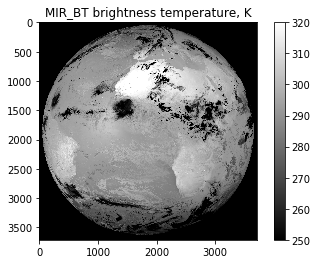

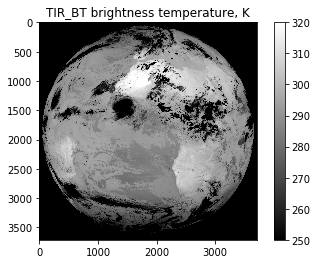

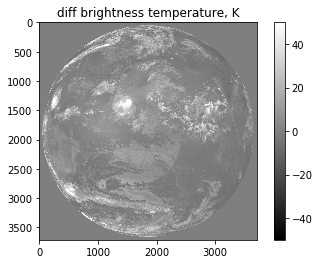

In [17]:
'''

Use Python (gdal) to read and examine some SEVIRI data

'''
# open the file 
g = gdal.Open('/vsizip/files/200909021445.zip/200909021445.img')
meta = g.GetMetadata()
print('bands available:',meta)
# read the 3 band dataset into an array called data
data = g.ReadAsArray()
print('data shape',data.shape)

vmin=[250,250,-50]
vmax=[320,320,50]
# plot the data
for i in range(3):
    plt.figure()
    plt.imshow(data[i],cmap='gray',vmin=vmin[i],vmax=vmax[i])
    plt.title(f"{meta['Band_%d'%(i+1)]} brightness temperature, K")
    plt.colorbar()

> We see the Meteosat full disk images above. We want to focus 
> on southern Africa -- Since this is a daytime image the land is warmer than the
> ocean (brighter in this rendition). Clouds are the coldest objects in
> the scene. The region of interest is approximately
>
> ![](images/image3.jpeg)
>
> *Figure 3: Meteosat SEVIRI TIR image, with Southern Africa boxed.*
>
> In the *Display Window* if you select *Enhance* and then *\[Image\]
> Linear 2%* a histogram "contrast" stretch will be applied to the
> displayed data in order to attempt to maximize the image contrast. You
> should be able to see patterns associated with lakes, clouds and
> rivers, which will be cooler than the land surface at this time. No
> obvious fires are apparent though.

(3, 3712, 3712)


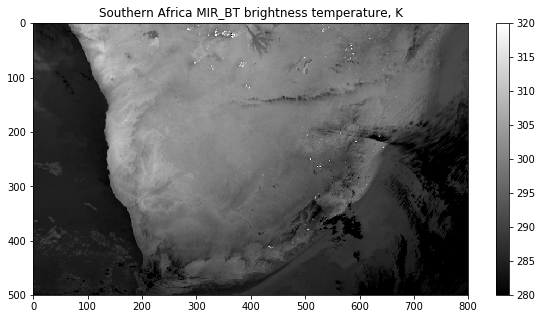

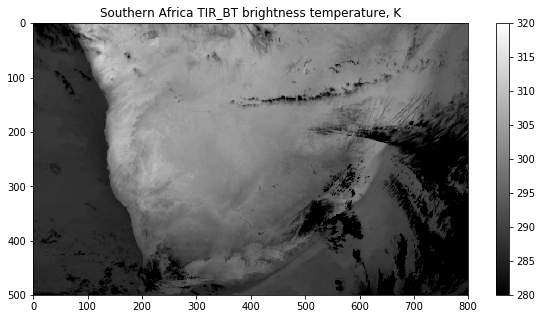

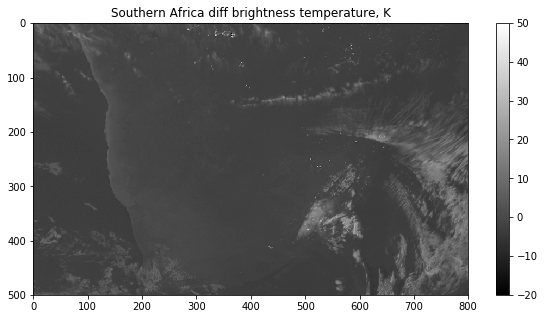

In [5]:
# x and y extents
x0,x1 = 2200,3000
y0,y1 = 2500,3000
# min and max T for plotting
vmin=[280,280,-20]
vmax=[320,320,50]

print(data.shape)
for i in range(3):
    plt.figure(figsize=(10,5))
    plt.imshow(data[i,y0:y1,x0:x1],cmap='gray',vmin=vmin[i],vmax=vmax[i])
    plt.title(f"Southern Africa {meta['Band_%d'%(i+1)]} brightness temperature, K")
    plt.colorbar()

> If we show the MIR image slightly zoomed in (the Okavango Delta in Botswana should be clearly visible in the image).
> You should clearly see some very bright
> pixels. 

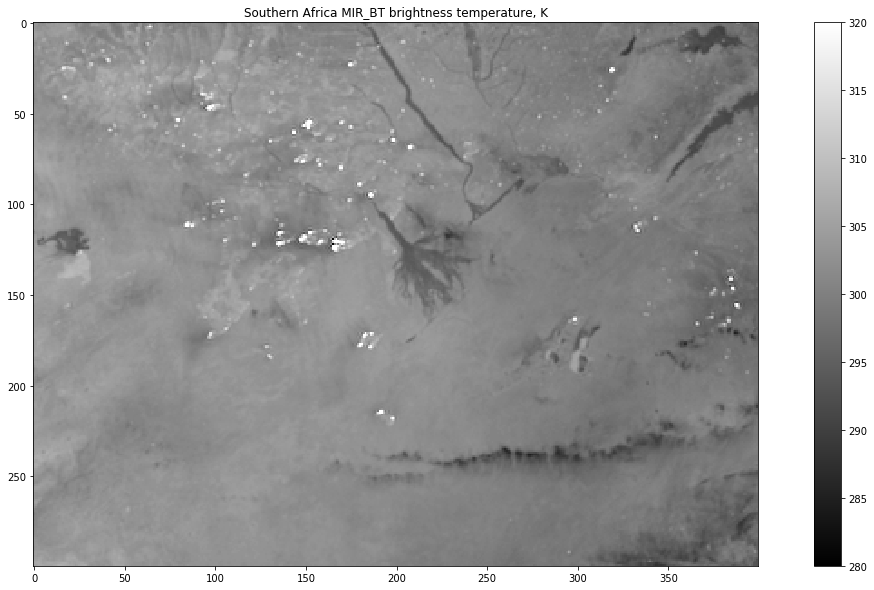

In [6]:
# x and y extents
x0,x1 = 2400,2800
y0,y1 = 2400,2700
plt.figure(figsize=(20,10))
plt.imshow(data[0,y0:y1,x0:x1],cmap='gray',vmin=vmin[0],vmax=vmax[0])
plt.title(f"Southern Africa {meta['Band_%d'%(0+1)]} brightness temperature, K")
_=plt.colorbar()

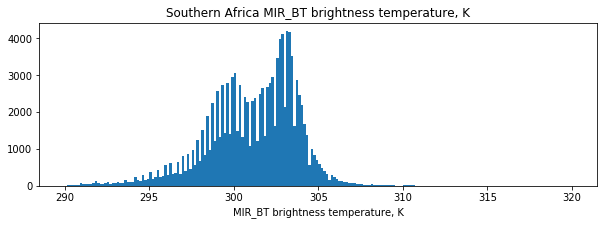

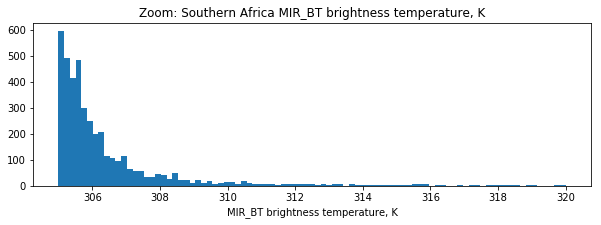

In [7]:
# image histogram
i = 0
plt.figure(figsize=(10,3))
plt.hist(data[i,y0:y1,x0:x1].flatten(), bins='auto',range=[290,320])
plt.xlabel(f"{meta['Band_%d'%(i+1)]} brightness temperature, K")
x=plt.title(f"Southern Africa {meta['Band_%d'%(i+1)]} brightness temperature, K")

# zoom
plt.figure(figsize=(10,3))
plt.hist(data[i,y0:y1,x0:x1].flatten(), bins='auto',range=[305,320])
plt.xlabel(f"{meta['Band_%d'%(i+1)]} brightness temperature, K")
x=plt.title(f"Zoom: Southern Africa {meta['Band_%d'%(i+1)]} brightness temperature, K")

> We can see from the histogram that the (small number of)  'high' value pixels form a tail above around 310 K, although the precise limits are difficult to determine.
> We can make a list of pixel locations with high values of 
> pixel brightness temperature. Here, we set a threshold of 310 K
> which picks up what we suppose to be fires. 
> Confirm from the histogram that the BT values
> of the fire pixels are much higher than those of the ambient
> background pixels. 

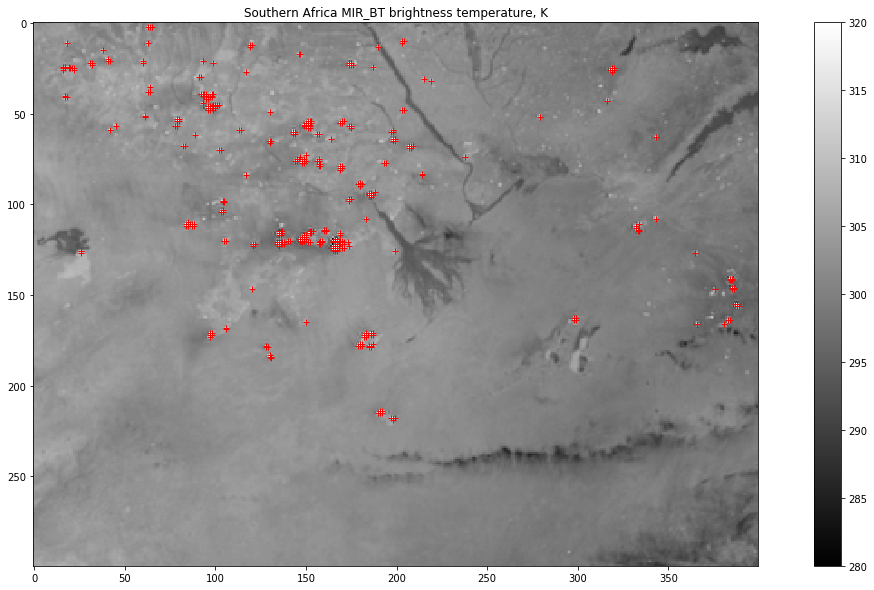

In [8]:
# x and y extents
x0,x1 = 2400,2800
y0,y1 = 2400,2700
i = 0
t_thresh = 310.0
# locations of pixels > t_thresh
highest = np.where(data[i,y0:y1,x0:x1] > t_thresh)

plt.figure(figsize=(20,10))
plt.imshow(data[i,y0:y1,x0:x1],cmap='gray',vmin=vmin[i],vmax=vmax[i])
plt.title(f"Southern Africa {meta['Band_%d'%(i+1)]} brightness temperature, K")
# plot the data points as red crosses
plt.plot(highest[1],highest[0],'r+')
_=plt.colorbar()

> The reason for this is,
> as shown in the figure below, fires emit radiation much more
> intensely in the MIR than in the TIR spectral region and so show up
> much more clearly against the background in the MIR.
>
> ![](images/image4.jpeg)
>
> *Figure 4: Planck function plots for backbody emitters at a range of
> temperatures, from ambient (\~ 300 K) to those in vegetation fires (\~
> 1000 K). The approximate wavelength range of the SEVIRI MIR (3.7 µm)
> and TIR (10.8 µm) spectral channels are shown. On this y-asis scale,
> emission at ambient wavelengths is seen to be close to the zero level,
> but in fact peaks around the location of the TIR spectral band (at
> around 10 W/m²/sr/µm). By contrast, the wavelength of peak emission
> from vegetation fires is seen to be located close to the MIR spectral
> band, where around 4000 W/m²/sr/µm are emitted.*

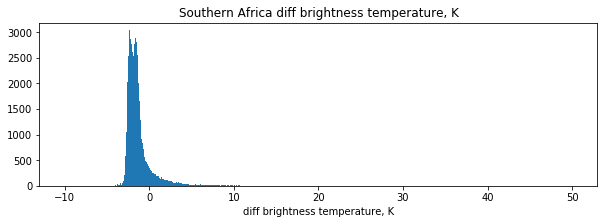

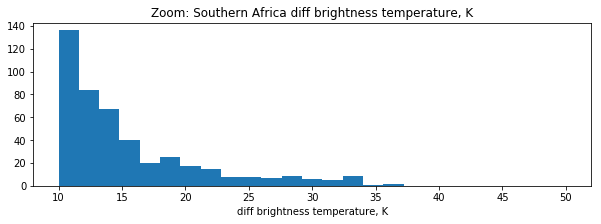

In [9]:
# image histogram
i = 2
plt.figure(figsize=(10,3))
plt.hist(data[i,y0:y1,x0:x1].flatten(), bins='auto',range=[-10,50])
plt.xlabel(f"{meta['Band_%d'%(i+1)]} brightness temperature, K")
x=plt.title(f"Southern Africa {meta['Band_%d'%(i+1)]} brightness temperature, K")

# zoom
plt.figure(figsize=(10,3))
plt.hist(data[i,y0:y1,x0:x1].flatten(), bins='auto',range=[10,50])
plt.xlabel(f"{meta['Band_%d'%(i+1)]} brightness temperature, K")
x=plt.title(f"Zoom: Southern Africa {meta['Band_%d'%(i+1)]} brightness temperature, K")

n points: 82


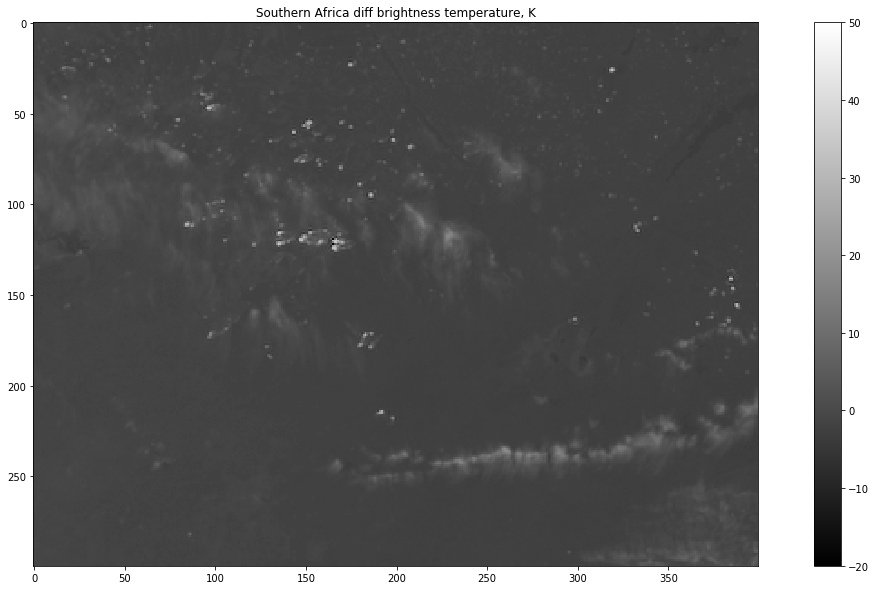

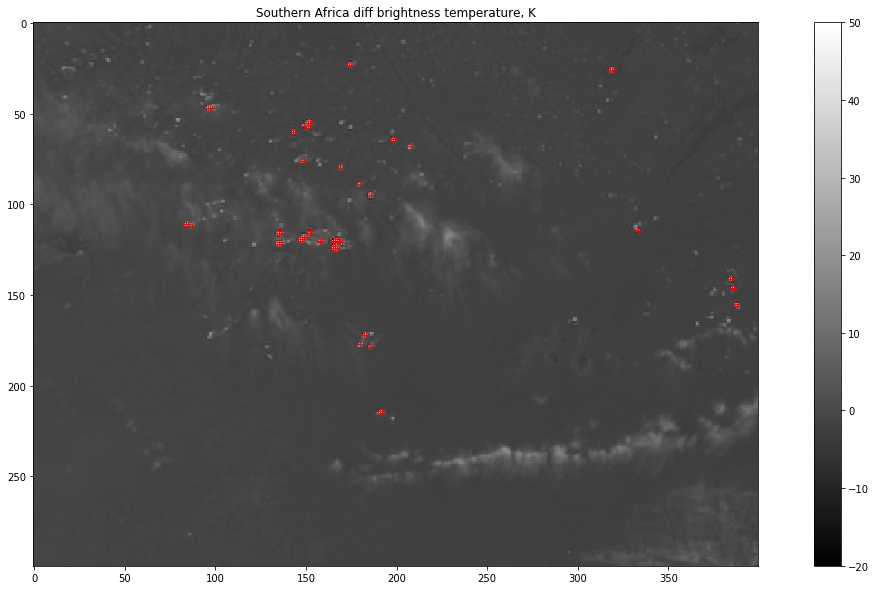

In [10]:
# x and y extents
x0,x1 = 2400,2800
y0,y1 = 2400,2700
# T diff
i = 2
t_thresh = 20
# locations of pixels > t_thresh
highest = np.where(data[i,y0:y1,x0:x1] > t_thresh)
print('n points:',len(highest[0]))

plt.figure(figsize=(20,10))
plt.imshow(data[i,y0:y1,x0:x1],cmap='gray',vmin=vmin[i],vmax=vmax[i])
plt.title(f"Southern Africa {meta['Band_%d'%(i+1)]} brightness temperature, K")
# plot the data points as red crosses
_=plt.colorbar()

plt.figure(figsize=(20,10))
plt.imshow(data[i,y0:y1,x0:x1],cmap='gray',vmin=vmin[i],vmax=vmax[i])
plt.title(f"Southern Africa {meta['Band_%d'%(i+1)]} brightness temperature, K")
# plot the data points as red crosses
plt.plot(highest[1],highest[0],'r+')
_=plt.colorbar()

> The 'difference' image shown above
>  highlights the fire pixels very well, and suppresses
> the influence of ambient background variations due to elevation
> changes for example (since such elevation of landcover variations will
> affect the MIR and TIR BT values similarly, whereas a fire will affect
> the MIR value much more significantly due to its peak emission
> wavelength lying in that waveband). However, you can also
> see that areas of cloud cover can be a problem for fire detection
> algorithms -- as they too have high MIR-TIR BT difference values.
> Cloudy pixels are usually masked out using other tests based on
> visible and TIR channel thresholding.
>
> Data such as these are used to produce operational "fire products"
> that can be used as input into the IPCC process. Lets check the
> performance of the operational SEVIRI fire detection algorithm -- used
> at the EUMETSAT Land Satellite Applications Facility identify active
> fire pixels and measure their emitted power (you can read the product
> details at
> [[http://landsaf.meteo.pt/]](http://landsaf.meteo.pt/) and
> click on "Fire Radiative Power -- Pixel".


>
> We also have a vector (shapefile) that shows the locations of all the
> active fire pixels detected by the automated fire detection scheme in
> this imaging slot. We can view this now and compare it to the MIR BT
> data. First, in ENVI, *close* all the display windows apart from
> Display 1 -- which should still be showing the MIR BT data.
>
> On the Display Window Menu use *Overlay/Vectors* and then *File/Open
> Vector File* to open the Shape File:
> **HDF5\_LSASAF\_MSG\_FRP-PIXEL-ListProduct\_SAfr\_200909021445.shp**
>
> \[You will need to change the "type of file" to *"Shapefile (\*.shp)"*
> in the open file dialogue window\]. Just click OK to accept all the
> defaults in the Vector Import dialogue window.
>
> Click the *Current Layer* colour square to change the colour of the
> vector points to another colour that is easier to see (e.g. red) and
> then press *Apply*. Now click "off' in the top right of the Vector
> Parameters window so you can scroll around the image window.
>
> Confirm to yourself that the fire pixel locations are reliably
> detected by the active fire detection algorithm used in the LandSAF
> FRP Pixel product. This is most clearly done using the Zoom Window --
> where you can click on the + and -- symbols to zoom in and out. You
> should find that the location of the detected fire pixels match well
> with the pixels showing increased MIR brightness temperatures.
> However, you might quite easily be able to find some pixels where the
> MIR BT signature looks like the pixel might contain a fire, but where
> the fire detection algorithm has not detected one (i.e. a likely
> omission error). Errors of commission (i.e. false detections) should
> be quite low though (\< 10%).
>
> Timeseries of active fire data like this can be used to estimate the
> area burned for input into the IPCC GHG Emissions estimation procedure
> (essentially by calculating the number of discrete fire pixels that
> occur in an area of interest). However, in these types of
> grassland-dominated or woodland environments a better type of product
> from which to estimate burned area is likely to be one based on
> detection of reflectance changes due to burning. We will examine this
> type of product next.



## ATSR World Fire Atlas (WFA) Long-Term Active Fire Data Record

> The ATSR series of polar orbiting satellite sensors has delivered the
> longest-running data record of active fire detections currently
> available, starting from 1995 to the present period. The record is
> termed the World Fire Atlas (WFA) and is derived via a very simple
> thresholding algorithm applied to nighttime observations made in the
> ASTR MIR spectral band. Though fires are generally much more active by
> day than by night, these observations do provide a reasonable data
> source from which the seasonality and interannual variability of fire
> in any particular region can be determined. Another positive point is
> that the WFA is very simple to use, and there is a web interface that
> is very easily understood
> ([[http://due.esrin.esa.int/page_wfa.php]).](http://due.esrin.esa.int/page_wfa.php))
> A user guide for this can be found at
> [[http://due.esrin.esa.int/page_wfaformats.php]](http://due.esrin.esa.int/page_wfaformats.php). A paper using the WFA
> data can be found at
> [[http://www.atmos-chem-phys.net/8/1911/2008/acp-8-1911-2008.html]](http://www.atmos-chem-phys.net/8/1911/2008/acp-8-1911-2008.html)
> and a paper on some of the issues to take into consideration with this
> dataset is (Mota et al., 2006) in [https://www.atmos-chem-phys.net/6/issue5.html].
>
> We do not expect you to eplore this dataset now, but you should be aware of it and some of its advantages and limitations.


## Burned Area Products

> These are essentially records of where a fire was identified to have
> burned the landscape, with the detection based on changes in the
> reflectance (or "colour") of the surface. In the lecture we saw that
> when an area of vegetation burns, its spectral reflectance generally
> falls since the vegetation is partly removed and the ground surface
> becomes at least partly covered by a layer of dark char. The
> advantages and disadvantages of this type of product are in some ways
> opposite to the active fire products you examined previously.
> **Advantages** of burned area products are primarily that they are a
> direct estimate of the actually burned area for use in Equation 1, and
> that secondly if clouds mask the surface from view during a particular
> satellite overpass, then it is quite likely that the burned area can
> still be detected on the next overpass (in fact in some environments
> it can be detected for many weeks or even months). **Disadvantages**
> are that they are often not very sensitive to small burns, and that
> since they only respond to changes in surface reflectance caused by
> the fire -- they only really provide useful data after the fire has
> happened (so do not provide "real time" information). They also only
> provide usable data during daytime overpasses.
>
> As we discussed in the lecture, the sore of spectral reflectance
> signature change associated with burning can be quite reliably
> detected by sophisticated algorithms (e.g. [[Roy, Lewis and Justice, 2002]](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.527.6543&rep=rep1&type=pdf)) trained to look for such temporal
> changes. In the figures below, you can see the "darker" colour signature
> of the imaged burned area, and in the spectral reflectance time series
> you can see how the pixel that burns around day 274 experiences a
> sharp decrease in reflectance ((open triangles) compared to the pixel
> that does not (closed triangles).

![](images/image5.jpeg)

![](images/image6.jpeg)

>
> One of the most commonly used burned area products is that produced
> from the MODIS sensor. You can read some background about MODIS at
> [[https://lpdaac.usgs.gov/dataset_discovery/modis/modis_products_table/mcd64a1_v006]](https://lpdaac.usgs.gov/dataset_discovery/modis/modis_products_table/mcd64a1_v006)
>
> The MODIS burned area product (MCD45) is a "Level 3" gridded 500m
> product, meaning that it represents heavily processed information
> produced from MODIS data via use of a dedicated set of algorithms,
> rather than "raw" MODIS data. It is produced in the standard MODIS
> *Land Tile* format in sinusoidal projection. Each tile has fixed
> earth-location, as shown in the first figure in this practical
> handout, and covers an area of approximately 1200 x 1200 km (10° x 10°
> at the equator). The product defines for each 500 m pixel within the
> tile the approximate day of burning -- identified via changes in
> spectral reflectance such as that shown in Figure 5. The MCD45 product
> is obtained from processing combined MODIS-TERRA and MODIS-AQUA 500m
> land surface reflectance data, and is stored in Hierarchical Data
> Format (HDF) -- a common data format used for science datasets.
>
> More info:
> [[https://lpdaac.usgs.gov/sites/default/files/public/product_documentation/mcd64_atbd_v6.pdf]](https://lpdaac.usgs.gov/sites/default/files/public/product_documentation/mcd64_atbd_v6.pdf)
>
> User guide:
> [[https://lpdaac.usgs.gov/sites/default/files/public/product_documentation/mcd64_user_guide_v6.pdf]](https://lpdaac.usgs.gov/sites/default/files/public/product_documentation/mcd64_user_guide_v6.pdf)

/home/ucfajlg/python/Wooster_fire_practical/docs/codes.py:89: RuntimeWarning: invalid value encountered in greater
  bad = np.logical_or(np.isnan(ba_values),ba_values>365)


dateData stats: 206.0 252.0


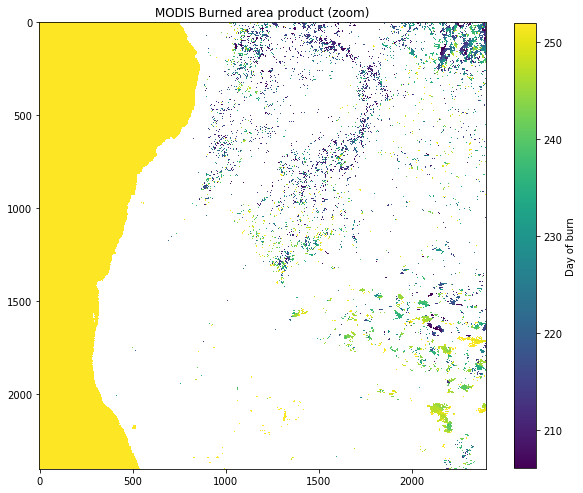

In [11]:
'''

Visualise the MODIS burned area product 🔥

'''
cf = 75.
# define the input file for later
shp = 'files/fire_archive_M6_37866.shp'
ifile = 'files/MCD45A1.A2008214.h19v10.005.2008279131907.hdf'

dateData,(ndays,vmin,vmax),\
(doy,ba_values,bad),(pix,x0,x1,y0,y1)  = read_ba(ifile,shp,cf)

# coordinates: use None to provide defaults
y0,y1 = None,None
x0,x1 = None,None

print('dateData stats:',vmin,vmax)
plt.figure(figsize=(10,10))
plt.imshow(dateData[y0:y1,x0:x1],vmin=vmin,vmax=vmax)
cbar = plt.colorbar(shrink=0.82)
cbar.ax.set_ylabel('Day of burn')
_=plt.title('MODIS Burned area product (zoom)')

> Each pixel here represents an area of around 500
> m x 500 m on the ground -- so these burns are rather large, and there
> are very many of them. You can see just what a large proportion of
> this environment burns each year.
>
> Each burnt pixel is coded by the day it burnt. If you change the parameters of `vmin` and `vmax` in the Python cell, you can see more detail on individual fire events, and even visualise the fire sweeping through the landscape.
> Better still, we can make an animation of this:

/opt/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater


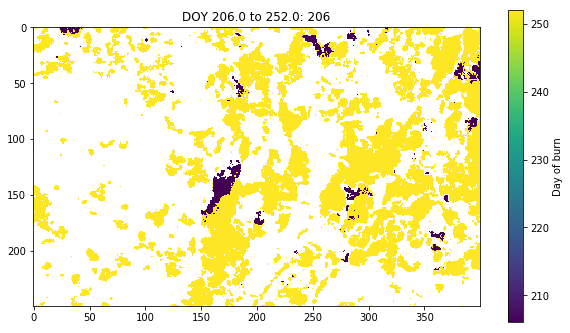

In [12]:
'''

Make a burned area animation from
the MODIS burned area product 🔥

Watch the fires spread in space/time
N.B. Dataset is 500 m spatial resolution

The file date is August 1st 2008 giving
data from 24 July to September 8

Experiment with changing the the window extent
to see fire in other parts of the scene

'''
global movie_data,vmax,vmin,ndays

dateData,(ndays,vmin,vmax),\
(doy,ba_values,bad),(pix,x0,x1,y0,y1) = read_ba(ifile,shp,cf)

def f(i):
    global movie_data,vmax,vmin,ndays
    # return data for frame i
    doy = int(vmin+(i*ndays)/100.)
    data = movie_data.copy().astype(float)
    data[movie_data>doy] = vmax
    return data

def updatefig(i):
    global movie_data,vmax,vmin,ndays
    # figure update for frame i
    doy = int(vmin+(i*ndays)/100.)
    im.set_array(f(i))
    plt.title(f'DOY {vmin} to {vmax}: {doy:03d}')
    return im,

# coordinates: image size is 2400 x 2400
# select a window by specifying x,y extent
y0_,y1_ = 0,250
x0_,x1_ = 2000,2400
# passed to animation
movie_data = dateData[y0_:y1_,x0_:x1_]
# set up figure size
fig = plt.figure(figsize=(10,7))
im = plt.imshow(f(0),animated=True,vmin=vmin,vmax=vmax)
cbar = plt.colorbar(shrink=0.82)
cbar.ax.set_ylabel('Day of burn')

# make the animation and plot
ani = animation.FuncAnimation(fig,updatefig)
HTML(ani.to_jshtml())

> Now let's load the EXCEL file:
> [[ModisBurnedArea\_by\_country\_landuse\_vegetation.xls](files/ModisBurnedArea\_by\_country\_landuse\_vegetation.xls)].
> This stores
> the amount of burned land detected by the MODIS burned area product by
> African country, and also by vegetation type and landuse -- exactly
> the information that the IPCC GHG Emissions Inventory process that we
> examined earlier requires.
>
> We load the **"summary_byCountry"** worksheet below:
>
> If we look at the
> country of **Namibia** -- the location of the MODIS Burned Area product
> you were just examining. You can see that Angola has a land area of
> almost 1 million km² and that on average 2.7% of it burns every year.
> This is hardly surprising, given the large proportion of desert in Namibia.
> If we look at nearby Angola, with 1.3 million km², more than 27% of the 
> country is directly affected by fire each year (this is largely in the 
> vast grasslands).

In [13]:
'''

Load the sheet 'summary_byCountry'
from the spreadsheet 
files/ModisBurnedArea_by_country_landuse_vegetation.xls

'''
xls = 'files/ModisBurnedArea_by_country_landuse_vegetation.xls'
df = pd.read_excel(xls,sheet_name='summary_byCountry',\
                  usecols = 'A,B,C,I:O')

df

,country,area (km2),mean % burnt,% burnt 2001,% burnt 2002,% burnt 2003,% burnt 2004,% burnt 2005,% burnt 2006,% burnt 2007
0,Algeria,2763072.75,0.024725,0.025174,0.006584,0.023592,0.029831,0.036426,0.012518,0.038951
1,Angola,1341312.00,27.142104,20.978090,25.670048,30.263400,31.205156,27.713417,26.775049,27.389570
2,Benin,123778.00,18.351686,20.809113,21.916330,17.187681,15.979230,19.333151,18.340777,14.895524
3,Botswana,655963.25,3.096888,6.275516,4.336482,0.722105,1.315066,0.743916,6.340403,1.944727
4,Burkina Faso,293079.75,13.006598,16.492773,13.963500,13.928797,11.367936,14.166558,11.549163,9.577458
5,Burundi,28561.00,3.126634,1.101280,6.200818,4.414934,4.635093,3.179691,1.412622,0.941999
6,Cameroon,491324.00,9.274890,10.983058,9.554282,9.781274,8.598815,8.306818,9.185628,8.514355
7,Central African Republic,654994.00,25.380253,27.686097,22.047754,28.908748,23.175544,25.304350,25.826519,24.712761
8,Chad,1388985.75,9.661674,9.777596,9.348893,10.146100,9.879432,10.163682,9.236102,9.079915
9,Comoros,1448.00,0.272106,0.209864,0.034892,0.785889,0.209790,0.314465,0.034934,0.314906


In [14]:
'''

Load the sheet 'summary_byCountry'
from the spreadsheet 
files/ModisBurnedArea_by_country_landuse_vegetation.xls

'''
xls = 'files/ModisBurnedArea_by_country_landuse_vegetation.xls'
df = pd.read_excel(xls,sheet_name='summary_byCountryVegLanduse',\
                  usecols = 'B:G')
pd.set_option('display.max_rows', 400)
df

,country,vegetation type,land use,total land area,mean % burnt,mean ha burned
0,Algeria,arid shrubland,cultivated,74.50,0.482625,3.595560e+01
1,Algeria,arid shrubland,protected areas,115229.50,0.000000,0.000000e+00
2,Algeria,arid shrubland,settlements,587.50,0.000000,0.000000e+00
3,Algeria,arid shrubland,uncultivated,2439711.50,0.000283,6.906464e+02
4,Angola,arid shrubland,cultivated,643.00,0.311248,2.001323e+02
5,Angola,arid shrubland,protected areas,22924.00,0.052909,1.212888e+03
6,Angola,arid shrubland,uncultivated,45749.50,0.187078,8.558735e+03
7,Angola,forest,cultivated,2315.75,26.096933,6.043397e+04
8,Angola,forest,protected areas,50.00,42.924788,2.146239e+03
9,Angola,forest,uncultivated,240512.25,31.334888,7.536424e+06


> Go to
> the **summary\_byCountryVegLanduse** worksheet above, and you can see that a
> landuse/landcover map has been used with a GIS to break down this
> total burned area into different vegetation classes (grassland, forest
> etc) and different landuse types (cultivated lands, protected areas
> etc). This is the last piece of information required by the different
> stages of the IPCC Inventory process -- and now the emissions
> inventory equation can be completely parameterised for each land use
> class.

**Use these two sheets to examine at a number of countries to try to develop an understanding of the fire impacts. You might find it interesting to look at the land cover types, and the % burned area over time.**
>
> Should you wish to examine or use more "Burned Area" data, the best
> way to obtain these MODIS Burned Area products is listed at
> [[http://modis-fire.umd.edu/index.html]](http://modis-fire.umd.edu/index.html)
> (click on Burned Area Products at top, and then "Get Data" at left).
> Early generations of the MCD45 product had provisional product
> maturity status, but this is common and the validation and
> intercomparison exercises are ongoing and the product performance is
> increasing with each new version.
>
> For now we will see how to get some other forms of remotely sensed
> fire data -- from a system called FIRMS.



## Accessing Other Remote Sensing Fire Information

> The Fire Information for Resource Management System (**FIRMS**):
> [[https://earthdata.nasa.gov/earth-observation-data/near-real-time/firms]](https://earthdata.nasa.gov/earth-observation-data/near-real-time/firms)
> provides near realtime information on global fire activity for use in resource
> assessment. 

Explore the information available on [FIRMS](https://earthdata.nasa.gov/earth-observation-data/near-real-time/firms) to find out the regions fires are actively burning at this time of year

![https://earthdata.nasa.gov/earth-observation-data/near-real-time/firms](images/firms1.png)

> We can now think about reconciling datasets. Wew do not expect a one-to-one
> correspondence between the fires obtained from active (thermal) data and those 
> from burned area products (why?). 
>
> Let's look at this for the example dataset we have looked at earlier over
> Angola/Namibia
>
> First, we access FIRMS to get the shapefile [files/fire_archive_M6_37866.shp](files/fire_archive_M6_37866.shp) for the date range and area we are interested in. To do this, you should request data with the following parameters. We have already obtained the dataset for Namibia for you ([files/fire_archive_M6_37866.shp](files/fire_archive_M6_37866.shp)) so you might like to have a go at ordering and plotting the dataset for Angola for these dates.

![https://earthdata.nasa.gov/earth-observation-data/near-real-time/firms](images/firms2.png)

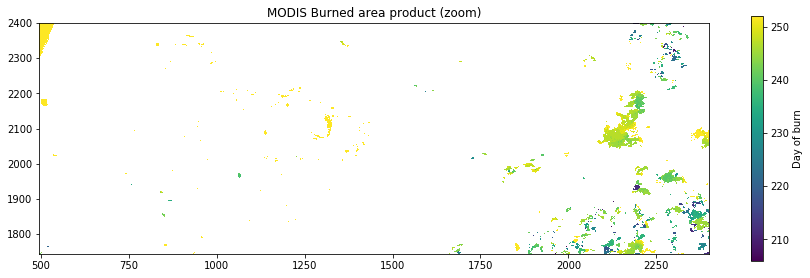

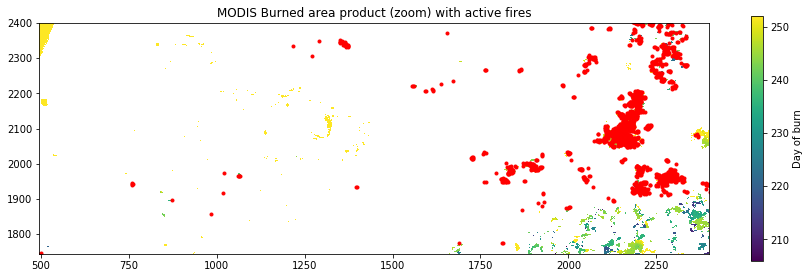

In [15]:
'''

Using the FIRMS shapefile for Namibia showing
MODIS active fires, plot this over the MODIS
burned area product for the same location and time period

'''
wide,high = dateData.shape
# coordinate limits:
y0,y1 = np.max([0,pix[1].min()]),np.min([high,pix[1].max()])
x0,x1 = np.max([0,pix[0].min()]),np.min([wide,pix[0].max()])

# plot the MODIS burned area image
for i in range(2):
    plt.figure(figsize=(15,15))
    plt.imshow(dateData,vmin=206,vmax=252)
    cbar = plt.colorbar(shrink=0.3)
    cbar.ax.set_ylabel('Day of burn')
    plt.title('MODIS Burned area product (zoom)')
    plt.xlim(x0,x1)
    _=plt.ylim(y0,y1)
    
# plot the active fire data from FIRMS
plt.plot(pix[0],pix[1],'r.')
_=plt.title('MODIS Burned area product (zoom) with active fires')

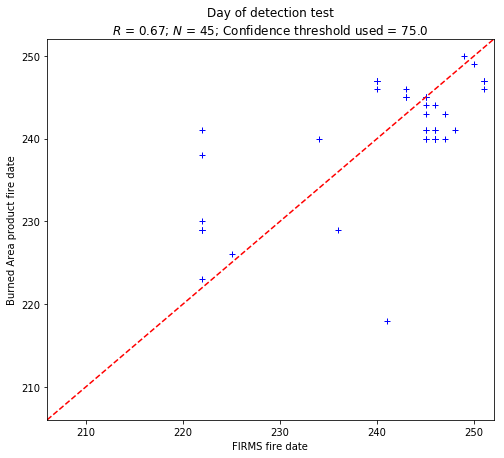

In [16]:
'''
Test correspondence between day of burn for active fires
and burned area product
'''
# do scatterplot 
plt.figure(figsize=(8,7))
plt.plot(doy[~bad],ba_values[~bad],'b+')
plt.xlim(vmin,vmax)
plt.ylim(vmin,vmax)
plt.plot([vmin,vmax],[vmin,vmax],'r--')
plt.xlabel('FIRMS fire date')
plt.ylabel('Burned Area product fire date')
r = scipy.stats.linregress(doy[~bad],ba_values[~bad]).rvalue
_=plt.title(f'Day of detection test\n$R$ = {r:.2f}; $N$ = {(~bad).sum()}; Confidence threshold used = {cf}')

This result is quite typical of analyses trying to understand the accuracy of fire activity datasets, and shows some of the problems with such comparisons.

* First, the datasets may not be completely independent (many burned area algorithms make use of the active fire data to drive the algorithm)
* Second, there can be good reasons for a lack of correspondence in date, for example, persistent cloud/smoke cover obscuring the view
* Third, it is in no real sense a validation, as there is no guarantee that we have all fires in either dataset

It is for such reasons that you will find large discrepencies between different fire datasets at present, although this area is the focus of much active research, and there is a great desire to produce high quality datasets from Earth Observation (e.g. [ESA CCI](https://www.esa-fire-cci.org)].

> For now, as a user, you should probably concentrate on use of the data from FIRMS. These
> systems offer a variety of downloadable data on fire, mostly again
> taken from the MODIS/VIIRS sensors and concentrating on "active fire" rather
> than "burned area" datasets.
>
> The MODIS active fire products are available in a variety of
> easy-to-use data formats. The data themselves are similar to the
> Meteosat SEVIRI active fire data you used earlier, albeit from
> observations made every \~ 6 hrs from MODIS' polar orbit rather than
> every 15 minutes from Meteosats geostationary orbit. The formats
> include:

a.  Shapefiles of fire locations from the past 48 hours and past 7 days

b.  Daily text files of fire locations via ftp site for the past two
    months

c.  Daily/weekly/near real-time CSV/text files of fire locations via
    email alerts

>
> Finally, there is also a **Google Earth KML** version of the same data
> available from FIRMS:
> [[https://earthdata.nasa.gov/earth-observation-data/near-real-time/firms/active-fire-data]](https://earthdata.nasa.gov/earth-observation-data/near-real-time/firms/active-fire-data)
>
> Load up the example you have been supplied with -
> [files/greece_fires_aug09.kml](files/greece_fires_aug09.kml) in ***Google Earth*** -- it contains
> burned area vector format data of the 2007 Greek Fires, derived from
> the MODIS MCD45 Burned Area product. Compare it visually with the
> original MODIS burned area product data,
> shown on the image of Greece below:

![](images/image8.jpeg)
> *Burned area map of the 2007 Greek fires, derived from the
> MODIS Burned Area Product (MCD45). Figure taken from Boschetti et al
> (2008).*

References:
===========

> Boschetti, Luigi, Roy, David, Barbosa, Paulo, Boca, Roberto and
> Justice, Chris (2008) A MODIS assessment of the summer 2007 extent
> burned in Greece, *International Journal of Remote Sensing*, 29, 2433
> -- 2436.



